In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# ! ln -s /content/drive/MyDrive/XAI-CV-CounterfactualSamples .
! ln -s /content/drive/MyDrive/src/XAI-CV-CounterfactualSamples .

In [3]:
%cd XAI-CV-CounterfactualSamples

/content/drive/MyDrive/src/XAI-CV-CounterfactualSamples


In [4]:
%cd exp_breakhis

/content/drive/MyDrive/src/XAI-CV-CounterfactualSamples/exp_breakhis


In [12]:
! pip install tensorflow==2.15.1 > /content/install.log 2> /content/err.log

# Initialization

In [13]:
import tensorflow as tf
import cv2
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

print(tf.__version__)

2.15.1


In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
import importlib
import configs
importlib.reload(configs)

<module 'configs' from '/content/drive/MyDrive/src/XAI-CV-CounterfactualSamples/exp_breakhis/configs.py'>

# Data Loader

In [14]:
class MyDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data_dir, subsets_file,
                       subset, expect_confidence=1,
                       concept_id_path=None, centroids_path=None,
                       batch_size=16, shuffle=False):
        self.data_dir = data_dir
        self.subsets_file = subsets_file
        self.subset = subset
        self.concept_id_path = concept_id_path
        self.centroids_path = centroids_path
        self.expect_confidence = expect_confidence
        self.batch_size = batch_size
        self.shuffle = shuffle

        self.filenames = None
        self.classnames = None
        self.dict_class_names = None
        self.df_concept_id = None

        self.load_data()
        self.load_concepts(self.concept_id_path, self.centroids_path)
        self.indices = None
        self.on_epoch_end()

    def load_concepts(self, concept_id_path, centroids_path):
      self.df_concept_id = pd.read_csv(concept_id_path)
      self.dict_centroids = dict()
      for disease in configs.CLASS_NAMES:
        centroids = np.load(f'{centroids_path}/centroids_{disease}_32.npy')
        self.dict_centroids[disease] = np.reshape(centroids, [32, 8, 8, 2048])
        print(disease, 'centroids', centroids.shape)

    def get_closest_concept(self, filename):
      basename = os.path.basename(filename)
      disease = [it for it in configs.CLASS_NAMES if it in filename][0]

      df = self.df_concept_id
      row = df[df['image'].str.contains(basename)]
      concept_id = row['concept_id'].values[0]
      concept = self.dict_centroids[disease][concept_id]
      return concept, concept_id

    def load_data(self):
        df_files = pd.read_csv(self.subsets_file, header='infer')
        self.df_files = df_files[df_files['grp'] == self.subset]
        self.filenames = self.df_files['filename'].tolist()
        self.classnames = self.df_files['classname'].tolist()
        self.dict_class_names = {name:i for i, name in enumerate(configs.CLASS_NAMES)}
        print('*** load_data')
        print(self.subset)
        print(len(self.filenames), 'found')
        print(df_files.head())
        print('***')

    def __len__(self):
        return int(np.ceil(len(self.filenames) / self.batch_size))

    def __getitem__(self, index):
        indices = self.indices[index*self.batch_size:(index+1)*self.batch_size]
        filenames = [self.filenames[k] for k in indices]
        classnames = [self.classnames[k] for k in indices]
        X, Ys = self.__data_generation(filenames, classnames)
        return X, Ys

    def on_epoch_end(self):
        self.indices = np.arange(len(self.filenames))
        if self.shuffle == True:
            np.random.shuffle(self.indices)

    def toOneHot(self, classname):
        v = np.zeros(configs.NUM_CLASS, dtype=np.float64)
        v[self.dict_class_names[classname]] = 1.0
        return v

    def __data_generation(self, filenames, classnames):
        num = len(filenames)
        X = np.empty([num, *configs.IMAGE_SIZE], dtype=np.float64)
        Y = np.empty([num, configs.NUM_CLASS])
        Y_concept = np.empty([num, 8, 8, 2048])
        HH, WW, _ = configs.IMAGE_SIZE
        for i, fn in enumerate(filenames):
            img = plt.imread(configs.DATA_DIR+'/'+fn)
            delta = (WW - HH) // 2
            img = img[:, delta:WW-delta-1]
            img = cv2.resize(img, configs.IMAGE_SIZE[:2])
            X[i] = np.array(img, dtype=np.float64)
            Y[i] = self.toOneHot(classnames[i])
            Y_concept[i], concept_id = self.get_closest_concept(fn)
            # print(fn, concept_id)

        return X, {'classifier256':Y,
                   'out_img':X,
                   'feature_map':Y_concept}

In [15]:
train_datagen = MyDataGenerator(
    configs.DATA_DIR,
    configs.SUBSETS_FILE,
    subset='train',
    expect_confidence=0,
    concept_id_path='outputs/concept_ids.csv',
    centroids_path='outputs/centroids-feature-classifier256',
    shuffle=True
)
val_datagen = MyDataGenerator(
    configs.DATA_DIR,
    configs.SUBSETS_FILE,
    subset='val',
    expect_confidence=0,
    concept_id_path='outputs/concept_ids.csv',
    centroids_path='outputs/centroids-feature-classifier256',
    shuffle=False
)
test_datagen = MyDataGenerator(
  configs.DATA_DIR,
    configs.SUBSETS_FILE,
    subset='test',
    expect_confidence=0,
    concept_id_path='outputs/concept_ids.csv',
    centroids_path='outputs/centroids-feature-classifier256',
    shuffle=False
)

*** load_data
train
4000 found
   mag    grp                                           filename  \
0   40  train  malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-1...   
1  400  train  malignant/SOB/ductal_carcinoma/SOB_M_DC_14-110...   
2  100  train  benign/SOB/adenosis/SOB_B_A_14-22549CD/100X/SO...   
3  100  train  malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-1...   
4   40  train  benign/SOB/adenosis/SOB_B_A_14-22549CD/40X/SOB...   

            classname  
0  mucinous_carcinoma  
1    ductal_carcinoma  
2            adenosis  
3  mucinous_carcinoma  
4            adenosis  
***
mucinous_carcinoma centroids (32, 131072)
ductal_carcinoma centroids (32, 131072)
adenosis centroids (32, 131072)
lobular_carcinoma centroids (32, 131072)
fibroadenoma centroids (32, 131072)
phyllodes_tumor centroids (32, 131072)
tubular_adenoma centroids (32, 131072)
papillary_carcinoma centroids (32, 131072)
*** load_data
val
1000 found
   mag    grp                                           filename  \
0  

(16, 256, 256, 3)
(16, 8)
(16, 8, 8, 2048)


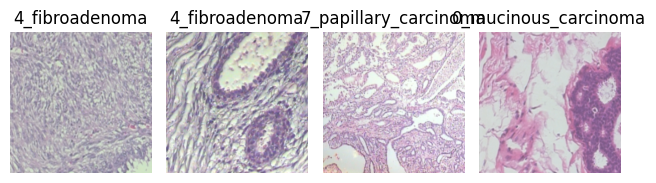

In [ ]:
X, Ys = train_datagen[2]
Y_img, Y_cls, Y_concept = Ys['out_img'], Ys['classifier256'], Ys['feature_map']
print(X.shape)
print(Y_cls.shape)
print(Y_concept.shape)

for i in range(4):
  plt.subplot(1, 4, i+1)
  plt.imshow((X[i]*255).astype(np.uint8))
  plt.axis('off')
  class_id = Y_cls[i].argmax()
  plt.title(str(class_id)+'_'+configs.CLASS_NAMES[class_id])
plt.tight_layout()
plt.show()

# Generator 256 x 256

In [16]:
class GeneratorBuilder():
    def double_conv_block(self, x, n_filters):
        x = tf.keras.layers.Conv2D(n_filters, 3,
                                   padding="same", activation="relu")(x)
        x = tf.keras.layers.Conv2D(n_filters, 3,
                                   padding="same", activation="relu")(x)
        return x

    def downsample_block(self, x, n_filters):
        f = self.double_conv_block(x, n_filters)
        p = tf.keras.layers.MaxPool2D(2)(f)
        p = tf.keras.layers.Dropout(0.5)(p)
        return f, p

    def upsample_block(self, x, conv_features, n_filters):
        x = tf.keras.layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
        x = tf.keras.layers.concatenate([x, conv_features])
        x = tf.keras.layers.Dropout(0.5)(x)
        x = self.double_conv_block(x, n_filters)
        return x

    def build_unet_model(self, input_shape, classifier, extractor, name):
        inputs = tf.keras.layers.Input(shape=input_shape)

        f1, p1 = self.downsample_block(inputs, 64)      # 128
        f2, p2 = self.downsample_block(p1, 128)         # 64
        f3, p3 = self.downsample_block(p2, 256)         # 32
        f4, p4 = self.downsample_block(p3, 512)         # 16
        bottleneck = self.double_conv_block(p4, 512)
        u5 = self.upsample_block(bottleneck, f4, 512)   # 32
        u6 = self.upsample_block(u5, f3, 256)           # 64
        u7 = self.upsample_block(u6, f2, 128)           # 128
        u8 = self.upsample_block(u7, f1, 64)            # 256

        # out_img
        out_img = tf.keras.layers.Conv2D(3, 1, padding="same",
                                activation = "sigmoid", name="out_img")(u8)

        # outputs_class
        classifier.trainable = False
        out_cls = classifier(out_img)

        # outputs_concept
        extractor.trainable = False
        out_concept = extractor(out_img)


        unet_model = tf.keras.Model(inputs,
                                    outputs=[out_img, out_cls, out_concept],
                                    name=name)

        return unet_model

In [17]:
classifier = tf.keras.models.load_model(configs.CLASSIFIER256_CHECKPOINT)
classifier.summary()

Model: "classifier256"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 8)                 16392     
                                                                 
 softmax (Softmax)           (None, 8)                 0         
                                                                 
Total params: 23604104 (90.04 MB)
Trainable params: 23550984 (89.84 MB)
Non-trainable params: 53120 (207.50 KB)
_________________________________________________________________


In [18]:
extractor = tf.keras.models.Model(
    inputs=classifier.get_layer('resnet50').inputs,
    outputs=classifier.get_layer('resnet50').outputs,
    name='feature_map'
)
extractor.load_weights(configs.CLASSIFIER256_CHECKPOINT)

In [19]:
model = GeneratorBuilder().build_unet_model(
    configs.IMAGE_SIZE,
    classifier,
    extractor,
    'generator256'
)
model.summary()

Model: "generator256"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                    

# Custom Loss

In [ ]:
model.outputs

[<KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'out_img')>,
 <KerasTensor: shape=(None, 8) dtype=float32 (created by layer 'classifier256')>,
 <KerasTensor: shape=(None, 8, 8, 2048) dtype=float32 (created by layer 'feature_map')>]

In [20]:
class CounterfactualCustomLoss(tf.keras.losses.Loss):
    def __init__(self):
        super(CounterfactualCustomLoss, self).__init__()

    def call(self, y_true, y_pred):
        return tf.reduce_mean(
                    tf.square(tf.reduce_sum(y_true * y_pred, axis=1)
                    )
                )

In [21]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss={'out_img':tf.losses.MeanSquaredError(),
                    'feature_map':tf.losses.MeanSquaredError(),
                    'classifier256':CounterfactualCustomLoss()},
              loss_weights={'out_img':1,
                            'feature_map':1/100,
                            'classifier256':1/10},
              metrics=[])

# Training

In [ ]:
cb_early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-4,
    patience=5,
    verbose=1,
    mode='auto'
)
cb_model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    configs.CHECKPOINTS_DIR + '/' + model.name + '/' + model.name,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='auto'
)
cb_reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5,
    verbose=1,
    mode='auto',
    min_delta=1e-4,
    min_lr=0
)

callbacks = [cb_model_checkpoint,
             cb_reduce_lr,
             cb_early_stop]

In [ ]:
history = model.fit_generator(train_datagen,
                    epochs=2024,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=val_datagen)

pd.DataFrame.from_dict(history.history) \
            .to_csv(configs.CHECKPOINTS_DIR+'/'+
                    model.name+'/history_generator.csv',
                    index=False)

Epoch 1/2024
250/250 [==============================] - ETA: 0s - loss: 0.0391 - out_img_loss: 0.0165 - classifier256_loss: 0.0209 - feature_map_loss: 2.0494
Epoch 1: val_loss improved from inf to 0.02625, saving model to checkpoints//generator256/generator256
250/250 [==============================] - 2407s 9s/step - loss: 0.0391 - out_img_loss: 0.0165 - classifier256_loss: 0.0209 - feature_map_loss: 2.0494 - val_loss: 0.0262 - val_out_img_loss: 0.0071 - val_classifier256_loss: 0.0222 - val_feature_map_loss: 1.6908 - lr: 1.0000e-04
Epoch 2/2024
250/250 [==============================] - ETA: 0s - loss: 0.0236 - out_img_loss: 0.0059 - classifier256_loss: 0.0193 - feature_map_loss: 1.5835
Epoch 2: val_loss improved from 0.02625 to 0.02057, saving model to checkpoints//generator256/generator256
250/250 [==============================] - 355s 1s/step - loss: 0.0236 - out_img_loss: 0.0059 - classifier256_loss: 0.0193 - feature_map_loss: 1.5835 - val_loss: 0.0206 - val_out_img_loss: 0.0032 

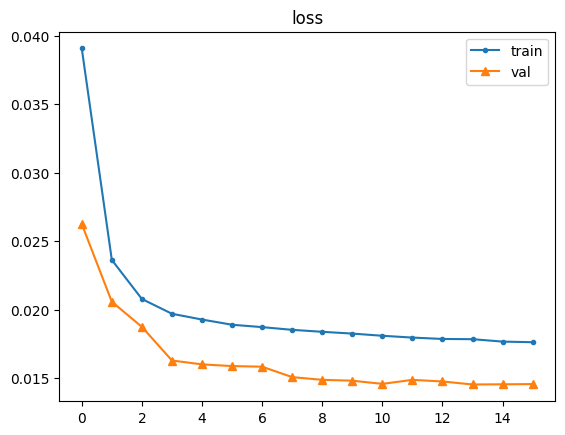

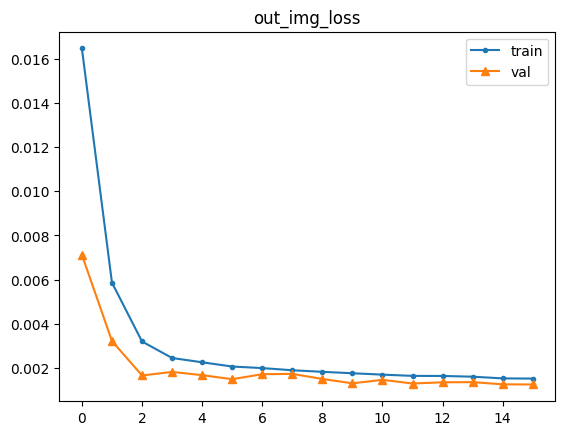

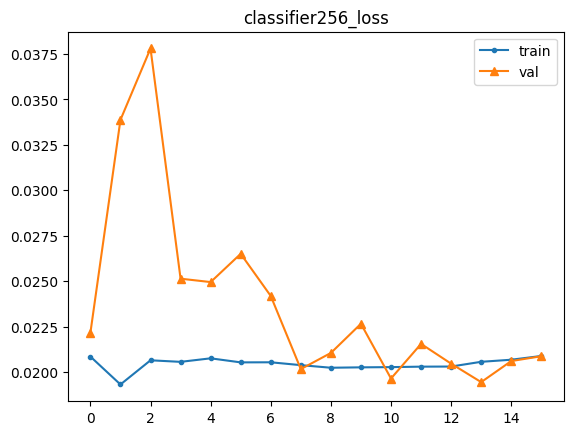

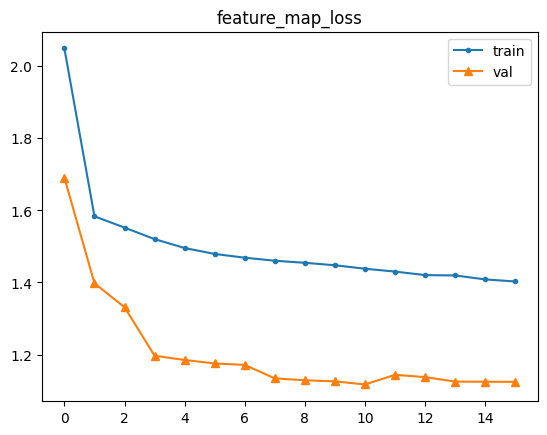

In [ ]:
df = pd.read_csv('checkpoints/generator256/history_generator.csv')

plt.plot(df['loss'], label='train', marker='.')
plt.plot(df['val_loss'], label='val', marker='^')
plt.legend()
plt.title('loss')
plt.show()

plt.plot(df['out_img_loss'], label='train', marker='.')
plt.plot(df['val_out_img_loss'], label='val', marker='^')
plt.legend()
plt.title('out_img_loss')
plt.show()

plt.plot(df['classifier256_loss'], label='train', marker='.')
plt.plot(df['val_classifier256_loss'], label='val', marker='^')
plt.legend()
plt.title('classifier256_loss')
plt.show()

plt.plot(df['feature_map_loss'], label='train', marker='.')
plt.plot(df['val_feature_map_loss'], label='val', marker='^')
plt.legend()
plt.title('feature_map_loss')
plt.show()

# Evaluation - Images

In [22]:
model.load_weights('checkpoints/generator256-20241201115000--label_target_zero_onetenth_concept_directed/generator256')

In [ ]:
train_loss = model.evaluate_generator(train_datagen, verbose=1)
val_loss = model.evaluate_generator(val_datagen, verbose=1)
test_loss = model.evaluate_generator(test_datagen, verbose=1)
print(train_loss, val_loss, test_loss)

182/182 [==============================] - 1393s 8s/step - loss: 0.0145 - out_img_loss: 0.0013 - classifier256_loss: 0.0192 - feature_map_loss: 1.1306
[0.017606107518076897, 0.0013209054013714194, 0.020001066848635674, 1.4285094738006592] [0.014537212438881397, 0.0013446208322420716, 0.01944536715745926, 1.1248058080673218] [0.01454151887446642, 0.0013147869613021612, 0.019205916672945023, 1.130613923072815]


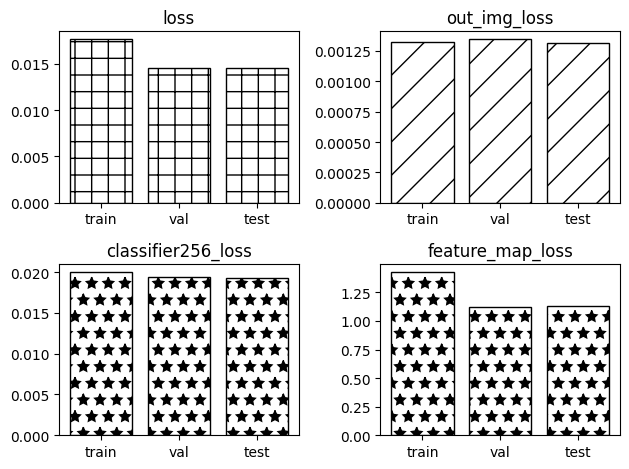

In [8]:
plt.subplot(2, 2, 1)
plt.bar(['train', 'val', 'test'], [0.017606108, 0.014537212, 0.014541519], color='white',
                                edgecolor='black', hatch='+')
plt.title('loss')

plt.subplot(2, 2, 2)
plt.bar(['train', 'val', 'test'], [0.001320905, 0.001344621, 0.001314787], color='white',
                                edgecolor='black', hatch='/')
plt.title('out_img_loss')

plt.subplot(2, 2, 3)
plt.bar(['train', 'val', 'test'], [0.020001067, 0.019445367, 0.019205917], color='white',
                                edgecolor='black', hatch='*')
plt.title('classifier256_loss')

plt.subplot(2, 2, 4)
plt.bar(['train', 'val', 'test'], [1.428509474, 1.124805808, 1.130613923], color='white',
                                edgecolor='black', hatch='*')
plt.title('feature_map_loss')

plt.tight_layout()
plt.show()

In [24]:
def plot_generated_images(X, generator, classifier, num=-1):
  X_, Y_, Z_ = generator.predict(X, verbose=0)
  Y_cls_original = classifier.predict(X)
  Y_cls_counter = classifier.predict(X_)
  D = X - X_
  print(X_.shape, Y_.shape)

  num = 4 if num > 0 else X.shape[0]
  np.set_printoptions(precision=4)
  for i in range(num):
    print(f'*** sample {i}')
    print(Y_cls_original[i])
    print(Y_cls_counter[i])

    plt.subplot(1, 3, 1)
    plt.imshow((X[i]*255).astype(np.uint8))
    plt.axis('off')
    plt.title('original')

    plt.subplot(1, 3, 2)
    plt.imshow((X_[i]*255).astype(np.uint8))
    plt.axis('off')
    plt.title('counterfactual')

    heatmap = (D[i]**2).sum(axis=2)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())

    plt.subplot(1, 3, 3)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title('difference')

    plt.show()

## train

In [25]:
plot_generated_images(train_datagen[0][0], model, classifier)

Output hidden; open in https://colab.research.google.com to view.

1/1 [==============================] - 0s 39ms/step
(16, 256, 256, 3) (16, 8)
*** sample 0
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1115 0.1377 0.1189 0.139  0.1463 0.13   0.1114 0.1051]


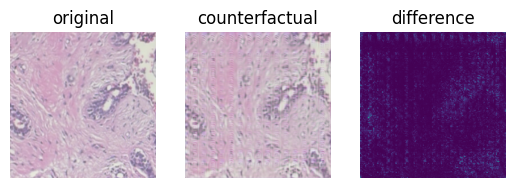

*** sample 1
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1121 0.1611 0.1083 0.1447 0.1421 0.1194 0.1079 0.1045]


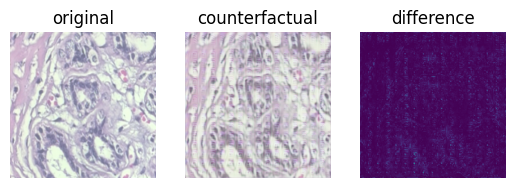

*** sample 2
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1047 0.1162 0.1336 0.1671 0.1017 0.1447 0.1029 0.129 ]


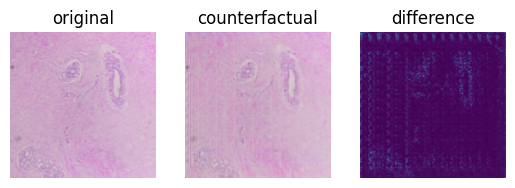

*** sample 3
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1022 0.1454 0.1541 0.1139 0.1497 0.1349 0.1004 0.0995]


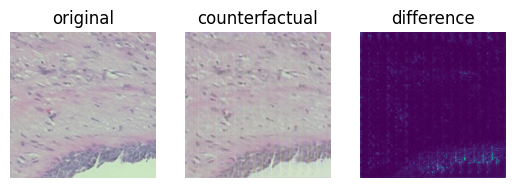

*** sample 4
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1033 0.1025 0.1031 0.1028 0.2783 0.1034 0.1041 0.1025]


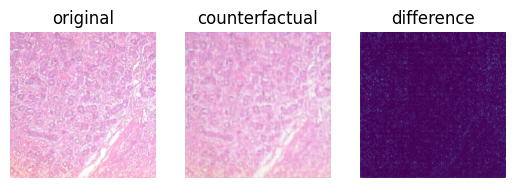

*** sample 5
[0.103  0.2796 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1485 0.1259 0.1226 0.1448 0.134  0.1099 0.1112 0.1032]


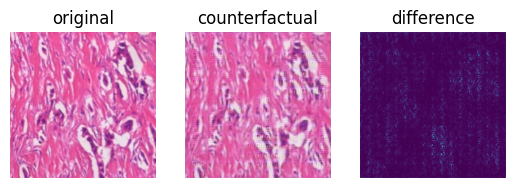

*** sample 6
[0.103  0.1029 0.2794 0.103  0.1029 0.1028 0.1028 0.1031]
[0.1099 0.1267 0.1871 0.119  0.1199 0.1249 0.1008 0.1119]


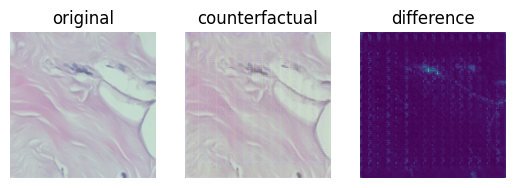

*** sample 7
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1359 0.1328 0.1234 0.131  0.1255 0.1095 0.1372 0.1047]


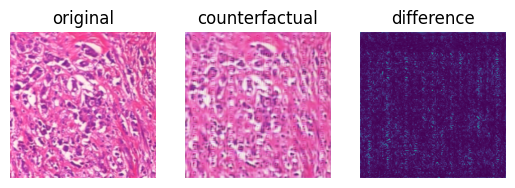

*** sample 8
[0.1029 0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.103 ]
[0.1088 0.129  0.1845 0.118  0.1275 0.121  0.102  0.1093]


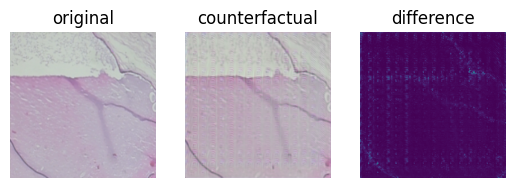

*** sample 9
[0.1029 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029 0.2797]
[0.1404 0.1289 0.1159 0.144  0.1316 0.1188 0.1142 0.1062]


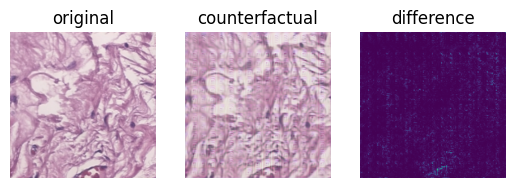

*** sample 10
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1104 0.1097 0.1152 0.1575 0.1619 0.1151 0.1283 0.1019]


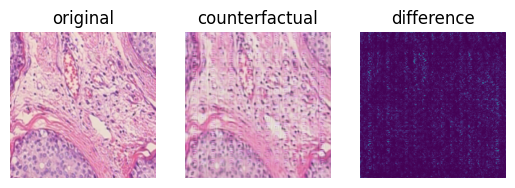

*** sample 11
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1199 0.1276 0.1108 0.1411 0.1549 0.119  0.1199 0.1069]


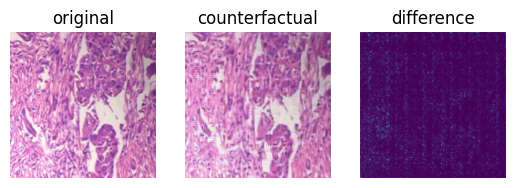

*** sample 12
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1137 0.1429 0.1139 0.1279 0.1198 0.1192 0.1313 0.1312]


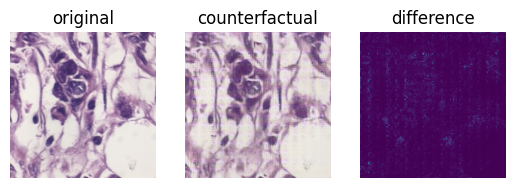

*** sample 13
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.125  0.1171 0.1247 0.1379 0.1492 0.1132 0.1211 0.1119]


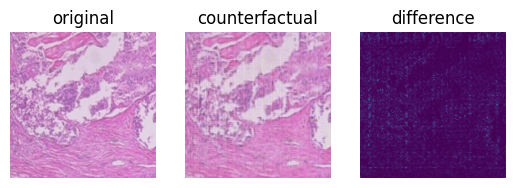

*** sample 14
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1318 0.1244 0.1194 0.1633 0.1268 0.1157 0.117  0.1015]


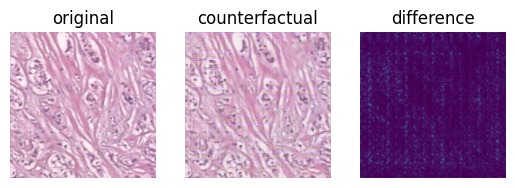

*** sample 15
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1121 0.1131 0.1105 0.1261 0.1652 0.1141 0.1433 0.1157]


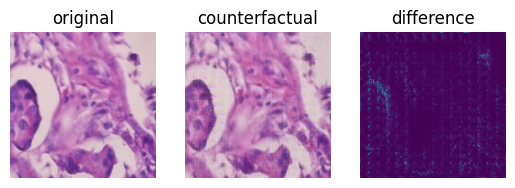

In [ ]:
plot_generated_images(train_datagen[32][0], model, classifier)

1/1 [==============================] - 0s 36ms/step
(16, 256, 256, 3) (16, 8)
*** sample 0
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1071 0.1248 0.1259 0.156  0.1495 0.1223 0.1133 0.1011]


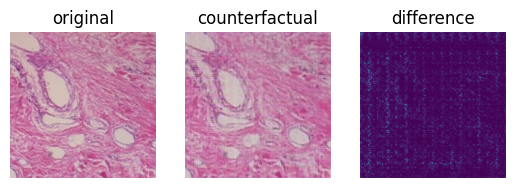

*** sample 1
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1141 0.1106 0.1275 0.1339 0.1618 0.132  0.1051 0.115 ]


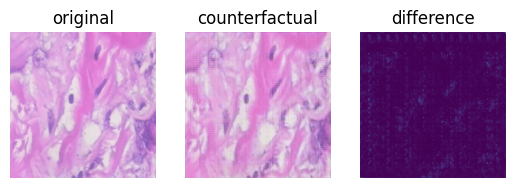

*** sample 2
[0.1031 0.1029 0.2772 0.1062 0.1024 0.1028 0.1024 0.103 ]
[0.1099 0.1157 0.1195 0.1583 0.1092 0.1486 0.1099 0.1289]


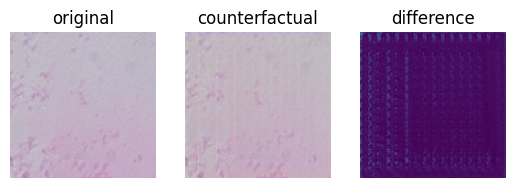

*** sample 3
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1075 0.1883 0.1107 0.1299 0.1216 0.1299 0.1068 0.1053]


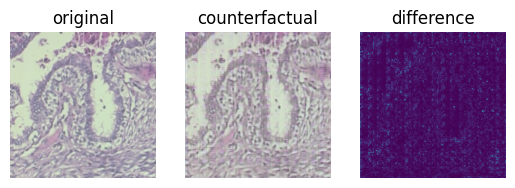

*** sample 4
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1184 0.1111 0.1132 0.1275 0.1822 0.1139 0.1178 0.1159]


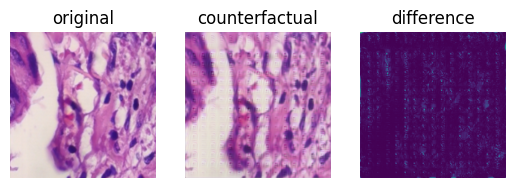

*** sample 5
[0.1016 0.2753 0.1016 0.1026 0.1131 0.1021 0.1017 0.1019]
[0.1073 0.1503 0.1266 0.1397 0.1365 0.1212 0.1079 0.1104]


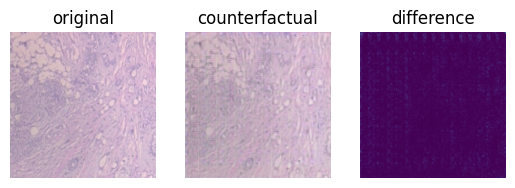

*** sample 6
[0.2797 0.1029 0.1029 0.1029 0.103  0.1029 0.1029 0.1029]
[0.1542 0.1097 0.1183 0.1779 0.1259 0.1117 0.1016 0.1006]


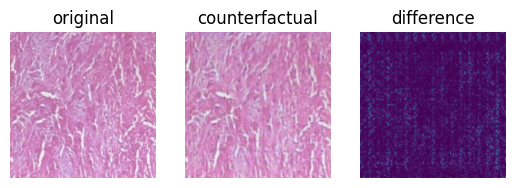

*** sample 7
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1067 0.1292 0.118  0.1377 0.1594 0.1364 0.1044 0.1082]


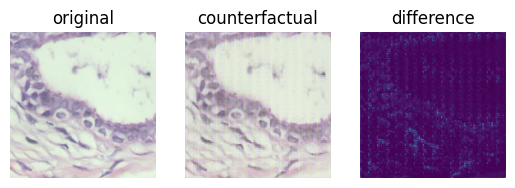

*** sample 8
[0.1029 0.2797 0.1029 0.103  0.1029 0.1029 0.1029 0.1029]
[0.1164 0.1216 0.1189 0.1332 0.1627 0.1078 0.1313 0.1081]


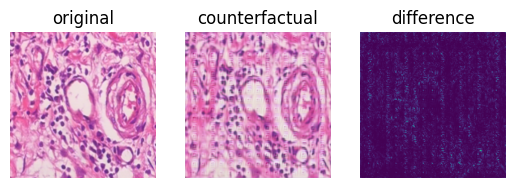

*** sample 9
[0.1033 0.1029 0.1029 0.2795 0.1029 0.1029 0.1028 0.1028]
[0.1457 0.0997 0.1075 0.2188 0.1193 0.1087 0.1042 0.0961]


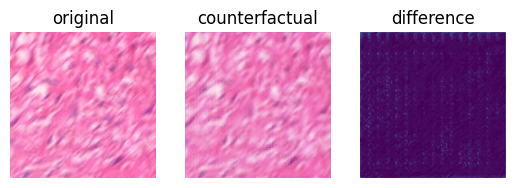

*** sample 10
[0.2796 0.1029 0.1029 0.1029 0.1031 0.1029 0.103  0.1029]
[0.109  0.0985 0.1165 0.1581 0.1992 0.1053 0.1057 0.1077]


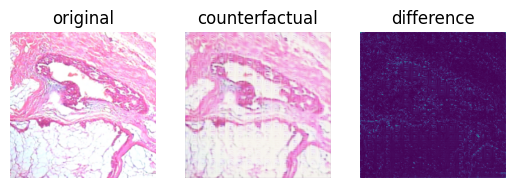

*** sample 11
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1096 0.1152 0.1105 0.1263 0.1496 0.1656 0.1141 0.1091]


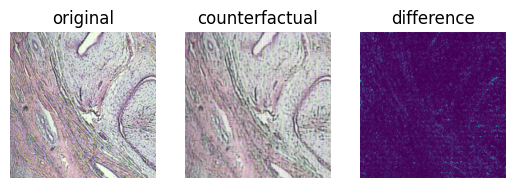

*** sample 12
[0.1029 0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1129 0.1145 0.1394 0.1314 0.1388 0.1239 0.1349 0.1042]


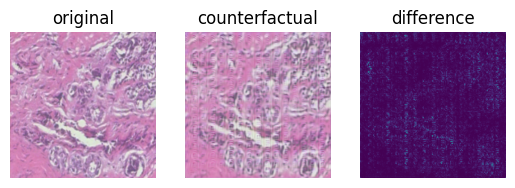

*** sample 13
[0.1029 0.1029 0.1029 0.1029 0.103  0.1029 0.1029 0.2797]
[0.1121 0.1249 0.1042 0.1364 0.1572 0.1241 0.1164 0.1246]


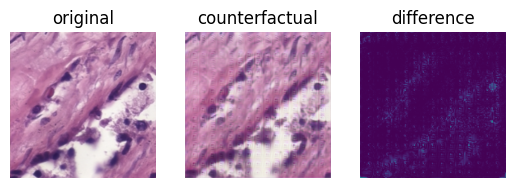

*** sample 14
[0.1031 0.1029 0.1029 0.103  0.1029 0.1029 0.1028 0.2796]
[0.1068 0.1522 0.1062 0.143  0.1327 0.1358 0.1192 0.104 ]


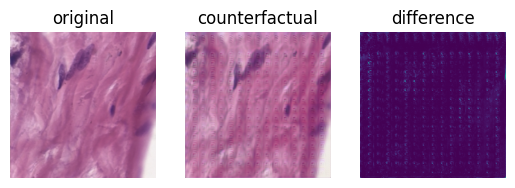

*** sample 15
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1236 0.1152 0.1208 0.1392 0.1485 0.12   0.1228 0.1098]


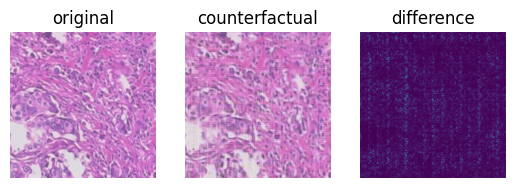

In [ ]:
plot_generated_images(train_datagen[64][0], model, classifier)

## validation

In [26]:
plot_generated_images(val_datagen[0][0], model, classifier)

Output hidden; open in https://colab.research.google.com to view.

1/1 [==============================] - 0s 47ms/step
(16, 256, 256, 3) (16, 8)
*** sample 0
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1133 0.1314 0.1074 0.1179 0.1854 0.1262 0.1113 0.1071]


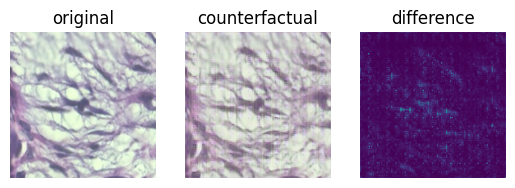

*** sample 1
[0.1026 0.2789 0.1026 0.1048 0.1031 0.1026 0.1026 0.1026]
[0.1074 0.125  0.1218 0.1509 0.1394 0.1298 0.12   0.1056]


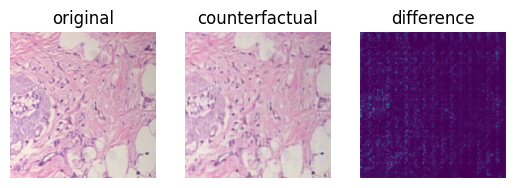

*** sample 2
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1287 0.1094 0.127  0.1624 0.1495 0.1173 0.1027 0.1029]


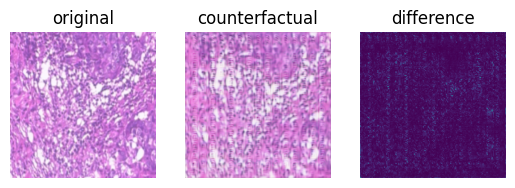

*** sample 3
[0.1029 0.2796 0.1029 0.1029 0.1029 0.1031 0.1029 0.1029]
[0.1095 0.1326 0.1132 0.1164 0.1751 0.1273 0.1167 0.1092]


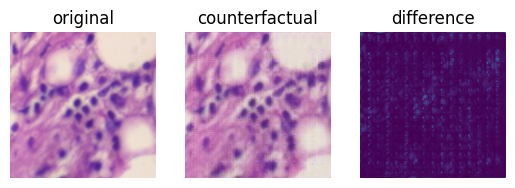

*** sample 4
[0.1029 0.2797 0.1029 0.103  0.1029 0.1029 0.1029 0.1029]
[0.1283 0.1172 0.1163 0.1633 0.1395 0.1208 0.1132 0.1015]


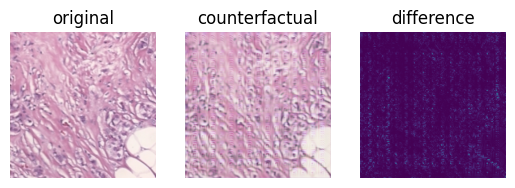

*** sample 5
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1547 0.1338 0.1086 0.1099 0.1523 0.1192 0.1106 0.1109]


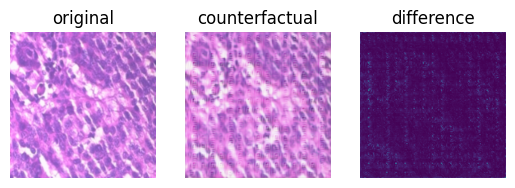

*** sample 6
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1235 0.1431 0.1147 0.1349 0.1253 0.1217 0.1298 0.107 ]


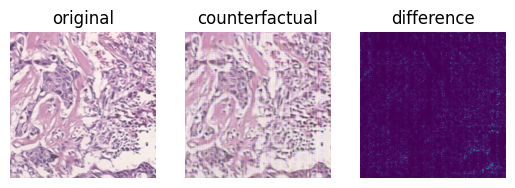

*** sample 7
[0.1045 0.1027 0.1028 0.2791 0.1028 0.1027 0.1027 0.1027]
[0.1164 0.1156 0.1229 0.1412 0.1498 0.1414 0.1087 0.1039]


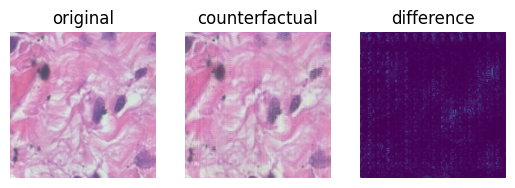

*** sample 8
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1304 0.1739 0.1127 0.1244 0.1282 0.1198 0.1058 0.1048]


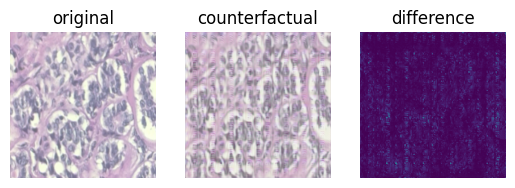

*** sample 9
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1118 0.1552 0.109  0.1366 0.134  0.1265 0.119  0.1079]


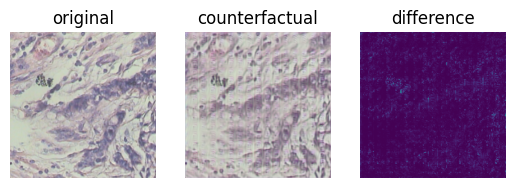

*** sample 10
[0.103  0.1029 0.103  0.2796 0.1029 0.1029 0.1029 0.1029]
[0.1225 0.1064 0.1465 0.168  0.1338 0.123  0.1008 0.099 ]


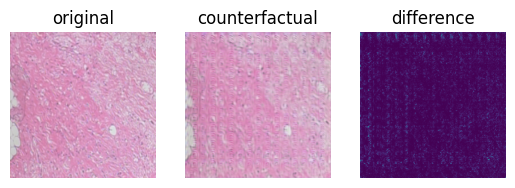

*** sample 11
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.117  0.1235 0.1092 0.1351 0.1788 0.1113 0.12   0.105 ]


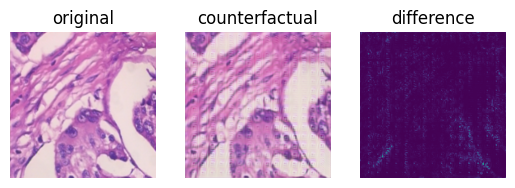

*** sample 12
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1285 0.1093 0.1324 0.155  0.1441 0.1183 0.1046 0.1079]


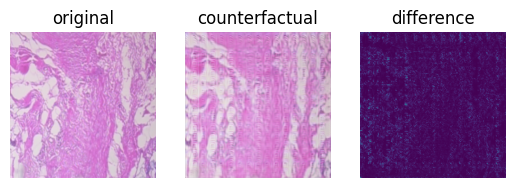

*** sample 13
[0.0918 0.0918 0.0918 0.0918 0.2494 0.1999 0.0918 0.0918]
[0.1031 0.1554 0.1076 0.1335 0.1469 0.141  0.1083 0.1041]


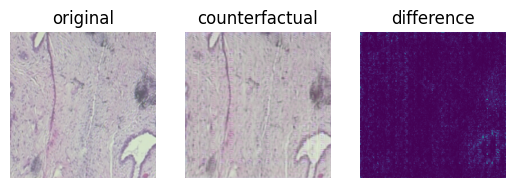

*** sample 14
[0.099  0.1866 0.1612 0.099  0.1569 0.0993 0.099  0.099 ]
[0.1061 0.1649 0.1191 0.1201 0.1326 0.1487 0.1045 0.104 ]


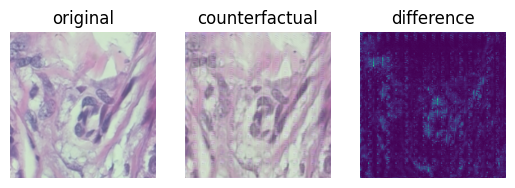

*** sample 15
[0.1029 0.2796 0.1029 0.1029 0.1031 0.1029 0.1029 0.1029]
[0.1415 0.1134 0.1248 0.1367 0.1396 0.1164 0.1157 0.112 ]


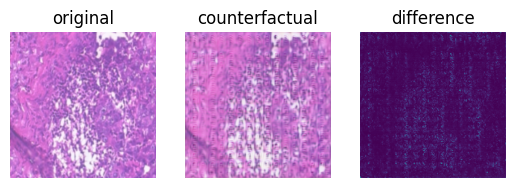

In [ ]:
plot_generated_images(val_datagen[16][0], model, classifier)

In [27]:
plot_generated_images(val_datagen[30][0], model, classifier)

Output hidden; open in https://colab.research.google.com to view.

## test

In [28]:
plot_generated_images(test_datagen[0][0], model, classifier)

Output hidden; open in https://colab.research.google.com to view.

1/1 [==============================] - 0s 29ms/step
(16, 256, 256, 3) (16, 8)
*** sample 0
[0.1039 0.2768 0.1027 0.106  0.1026 0.1026 0.1027 0.1027]
[0.1058 0.1284 0.1274 0.1398 0.1471 0.1157 0.1242 0.1115]


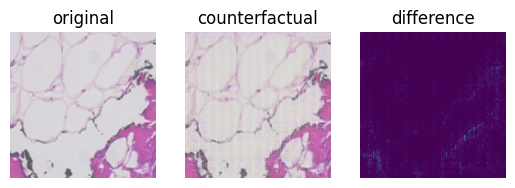

*** sample 1
[0.1029 0.1032 0.1028 0.2794 0.103  0.1028 0.1029 0.103 ]
[0.1146 0.1011 0.1186 0.2023 0.1473 0.1119 0.1052 0.0991]


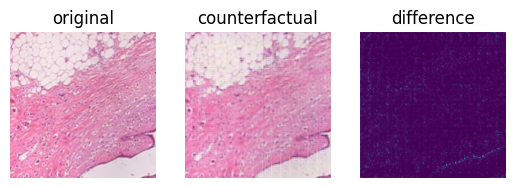

*** sample 2
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1376 0.1116 0.1317 0.1329 0.1596 0.1138 0.108  0.1048]


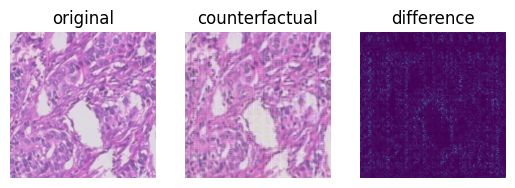

*** sample 3
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1285 0.1224 0.1213 0.1703 0.1223 0.1122 0.1083 0.1147]


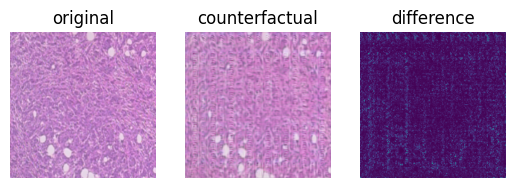

*** sample 4
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.124  0.1261 0.1112 0.1224 0.1507 0.1292 0.1144 0.122 ]


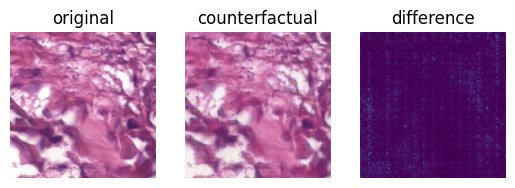

*** sample 5
[0.1012 0.2742 0.1012 0.1163 0.103  0.1013 0.1014 0.1014]
[0.112  0.1316 0.1171 0.1513 0.1383 0.1318 0.108  0.11  ]


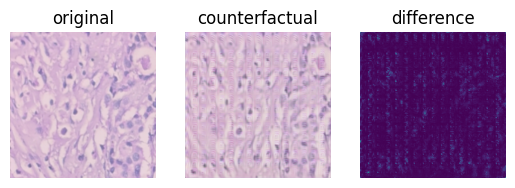

*** sample 6
[0.0962 0.1603 0.0962 0.2573 0.1002 0.0974 0.0962 0.0962]
[0.1065 0.13   0.1339 0.1637 0.1206 0.1385 0.0992 0.1075]


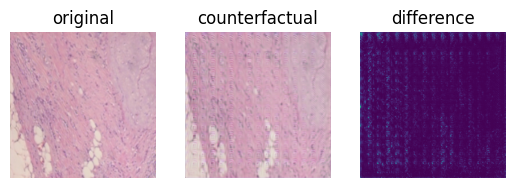

*** sample 7
[0.1963 0.0919 0.0957 0.2479 0.0926 0.0919 0.092  0.0919]
[0.1163 0.1097 0.1341 0.1685 0.1378 0.1252 0.1096 0.0988]


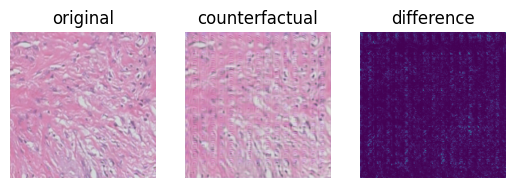

*** sample 8
[0.195  0.1132 0.1791 0.1002 0.1116 0.1001 0.1001 0.1007]
[0.115  0.1481 0.1377 0.1486 0.1356 0.1125 0.1016 0.101 ]


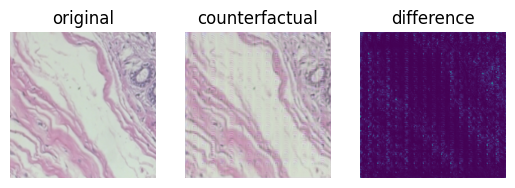

*** sample 9
[0.1029 0.1029 0.1029 0.1029 0.2797 0.1029 0.1029 0.1029]
[0.1031 0.1023 0.1031 0.1025 0.2781 0.1032 0.1052 0.1025]


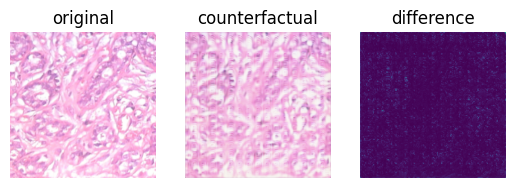

*** sample 10
[0.1056 0.1271 0.1015 0.2665 0.1005 0.0998 0.0994 0.0995]
[0.1342 0.1108 0.1326 0.1612 0.129  0.12   0.104  0.1082]


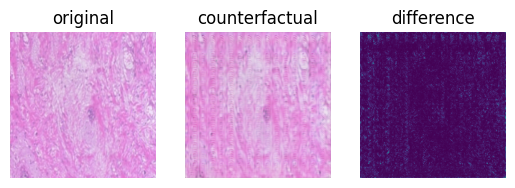

*** sample 11
[0.1029 0.2796 0.1029 0.1029 0.1032 0.1029 0.1029 0.1029]
[0.109  0.1253 0.1121 0.1576 0.1621 0.1171 0.1138 0.1031]


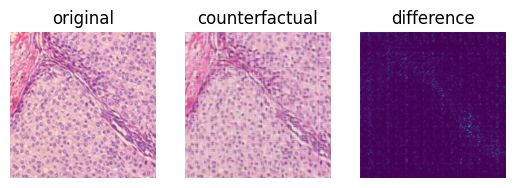

*** sample 12
[0.1091 0.1022 0.1022 0.1022 0.1022 0.1022 0.2778 0.1022]
[0.1051 0.1262 0.1409 0.1234 0.1494 0.1335 0.1127 0.1089]


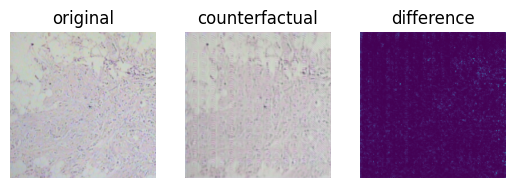

*** sample 13
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1088 0.1328 0.1462 0.142  0.1262 0.1294 0.1016 0.1129]


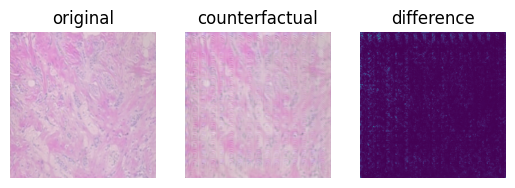

*** sample 14
[0.1029 0.2797 0.1029 0.1029 0.1029 0.1029 0.1029 0.1029]
[0.1346 0.1098 0.1131 0.1177 0.1667 0.116  0.113  0.1291]


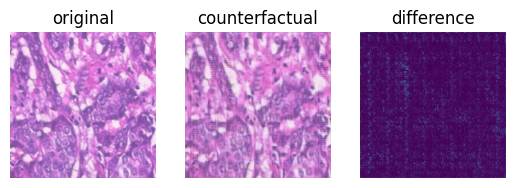

*** sample 15
[0.1027 0.2792 0.1033 0.1037 0.1027 0.1028 0.1027 0.1027]
[0.1066 0.1274 0.1413 0.1525 0.1131 0.1359 0.1057 0.1175]


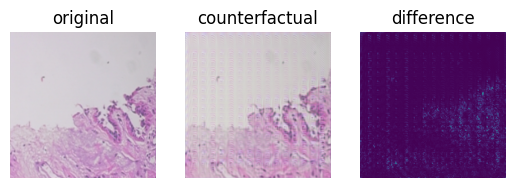

In [ ]:
plot_generated_images(test_datagen[32][0], model, classifier)

In [29]:
plot_generated_images(test_datagen[18][0], model, classifier)

Output hidden; open in https://colab.research.google.com to view.

# Evaluation - Confidence Diff

In [ ]:
def compute_confidence_diff(datagen, tag_subset, generator, classifier):
    df = {'Y_cls_original':[],
          'Y_cls_counter':[]}
    for X, Ys in datagen:
        X_, _, _ = generator.predict(X, verbose=0)
        Y_cls_original = classifier.predict(X, verbose=0)
        Y_cls_counter = classifier.predict(X_, verbose=0)

        num = X.shape[0]
        Y_label = Ys['classifier256']
        class_ids = Y_label.argmax(axis=1)

        df['Y_cls_original'] += list(Y_cls_original[range(num), class_ids])
        df['Y_cls_counter'] += list(Y_cls_counter[range(num), class_ids])

        # print(class_ids)
        # print(Y_cls_original[range(num), class_ids])
        # print(Y_cls_counter[range(num), class_ids])

    df = pd.DataFrame(df)
    df.to_csv('eval_confidence_diff_%s.csv'%(tag_subset))

In [ ]:
compute_confidence_diff(train_datagen, 'train', model, classifier)

In [ ]:
compute_confidence_diff(val_datagen, 'val', model, classifier)

In [ ]:
compute_confidence_diff(test_datagen, 'test', model, classifier)

In [9]:
def compute_result(filename):
    print(os.path.basename(filename))
    df = pd.read_csv(filename, header='infer')
    df['count_decline'] = (df['Y_cls_original'] > df['Y_cls_counter']).astype(int)
    df['percentage_decline'] = (df['Y_cls_original'] - df['Y_cls_counter']) / df['Y_cls_original']

    count_decline = df['count_decline'].sum() / df['count_decline'].count()
    percentage_decline = df[df['count_decline'] == 1]['percentage_decline'].mean()
    print('count_decline =', count_decline)
    print('percentage_decline =', percentage_decline)
    return df

In [10]:
df = compute_result(
    'eval_confidence_diff_train.csv')
df = compute_result(
    'eval_confidence_diff_val.csv')
df = compute_result(
    'eval_confidence_diff_test.csv')

eval_confidence_diff_train.csv
count_decline = 0.99525
percentage_decline = 0.4967655986696012
eval_confidence_diff_val.csv
count_decline = 0.907
percentage_decline = 0.47472639483786166
eval_confidence_diff_test.csv
count_decline = 0.9075283602612582
percentage_decline = 0.47644718722841395
